SADFasf asf asfasf as ASf a

In [123]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


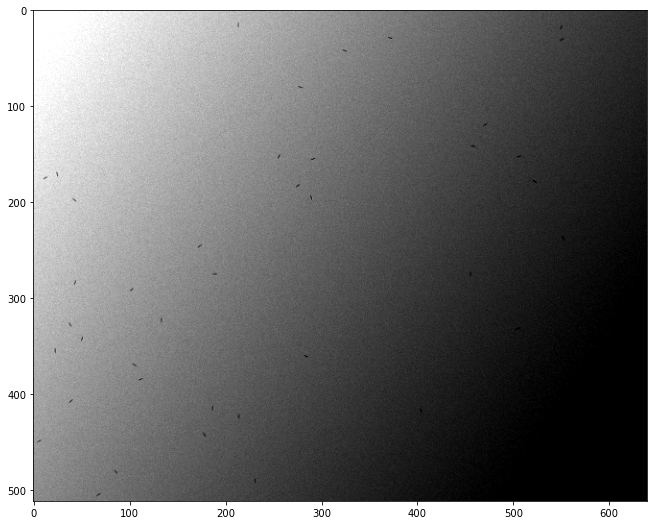

In [124]:
%load_ext autoreload
%autoreload 2

from loader import *
from models import *
from utils import *
from plotting import *

im_size_width, im_size_height, radius = 640, 512, (1.5e-7, 9e-7, 1.5e-7)
plankton = stationary_ellipsoid_plankton(im_size_height, im_size_width, radius, label=1)

gradient_amp = 0.5
microscope = plankton_brightfield(im_size_height, im_size_width, gradient_amp)

no_of_planktons = 50
sample = create_sample(plankton, no_of_planktons)

noise_amp = 2
norm_min, norm_max= -0.2, 1.2
image = create_image(noise_amp, sample, microscope, norm_min, norm_max)

plot_image(image)

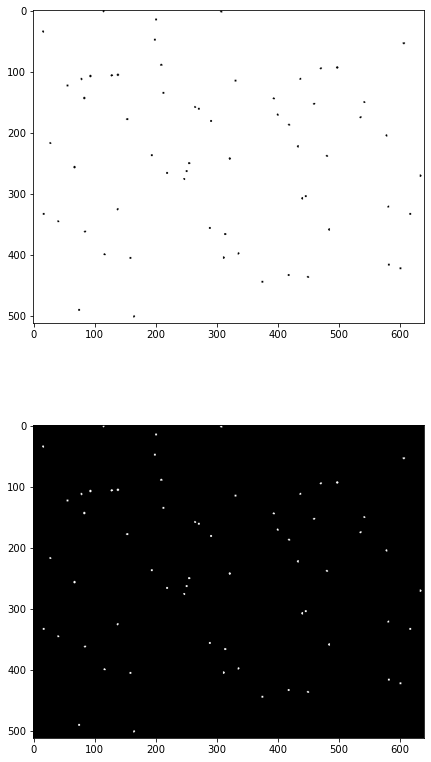

In [2]:
label = get_target_image(image.resolve())
label_function = get_target_image
plot_label(label_function, image)

In [5]:
batch_function = create_custom_batch_function(image, 
                                              outputs=[0], 
                                              function_img=[Normalize_image],
                                              function_diff=[Normalize_image])

In [6]:
from deeptrack.generators import ContinuousGenerator
generator = ContinuousGenerator(
    image,
    get_target_image,
    batch_function,
    batch_size=2,
    min_data_size=4,
    max_data_size=512
    )

In [7]:
no_of_inputs, number_of_outputs = 1, 2
model = generate_unet(im_size_height, im_size_width, no_of_inputs, number_of_outputs)
model = train_model(model, generator, patience=20, epochs=20, steps_per_epoch=2)

Generating 4 / 4 samples before starting training
Epoch 1/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0012
Epoch 2/20
2/2 [==============================] - 0s 46ms/step - loss: 9.9324e-04
Epoch 3/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0011
Epoch 4/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0011
Epoch 5/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0012
Epoch 6/20
2/2 [==============================] - 0s 48ms/step - loss: 8.7254e-04
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 8.6847e-04
Epoch 8/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0012
Epoch 9/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0012
Epoch 10/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0011
Epoch 11/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0012
Epoch 12/20
2/2 [==============================] - 0s 43ms/step - loss: 9.3254

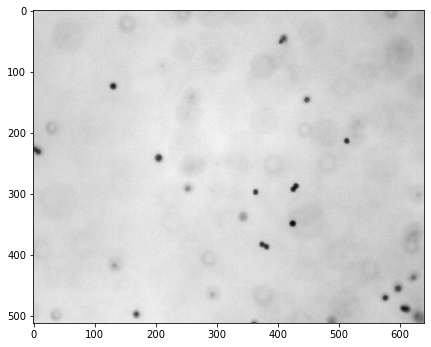

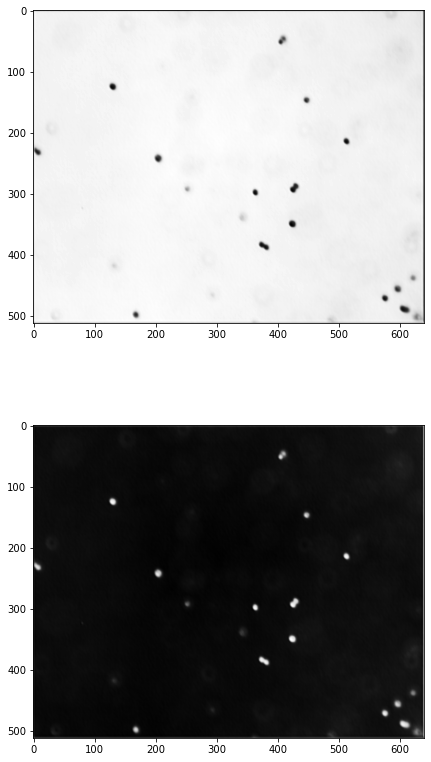

In [55]:
# outputs = ["img", "img", "img", "diff", "diff"]
# output_numbers = [0, 1, 2, [0,1], [1,2]]
folder_path = 'E:\Documents\Anaconda\Jupyterkod\Exjobb\Egen kod\Exjobb\From erik\\alexandrium2'
calculated_mean_image = get_mean_image(folder_path, im_size_width, im_size_height)
im_stack = get_image_stack(
    outputs=[0], 
    folder_path='E:\Documents\Anaconda\Jupyterkod\Exjobb\Egen kod\Exjobb\From erik\\alexandrium2', 
    frame_im0=20, 
    im_size_width=640, 
    im_size_height=512,
    function_img=[Normalize_image])

plot_im_stack(im_stack)
plot_prediction(model=model, im_stack=im_stack)

In [84]:
positions = extract_positions(
    no_of_frames=50, 
    outputs=[0], 
    folder_path='E:\Documents\Anaconda\Jupyterkod\Exjobb\Egen kod\Exjobb\From erik\\alexandrium2', 
    frame_im0=20, 
    im_size_width=640, 
    im_size_height=512,
    model=model, 
    layer=1, 
    value_threshold=0.7,
    function_img=[Normalize_image])

In [120]:
list_of_plankton = assign_positions_to_planktons(positions, max_dist=35, threshold=11, extrapolate=True)
list_of_plankton = Interpolate_gaps_in_plankton_positions(list_of_plankton=list_of_plankton)
list_of_plankton = Trim_list_from_stationary_planktons(list_of_plankton=list_of_plankton, min_distance=25)

plankton_track, plankton_dont_track = split_plankton(percentage_threshold=0, list_of_plankton=list_of_plankton)

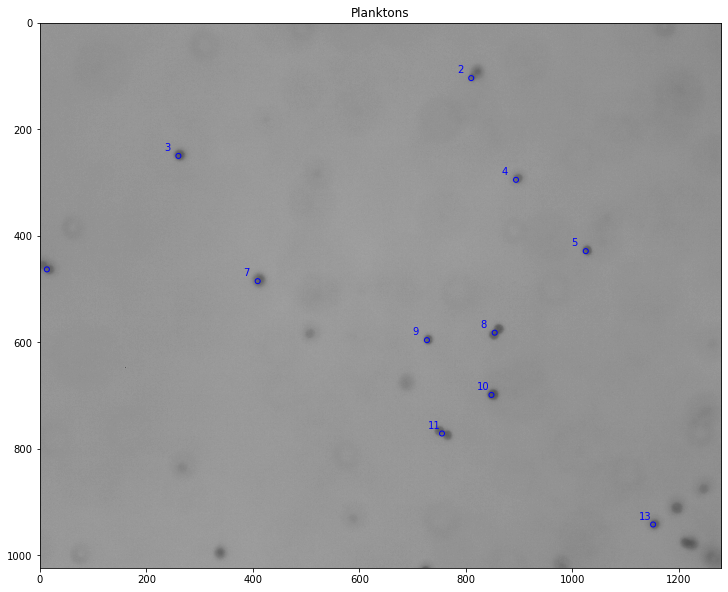

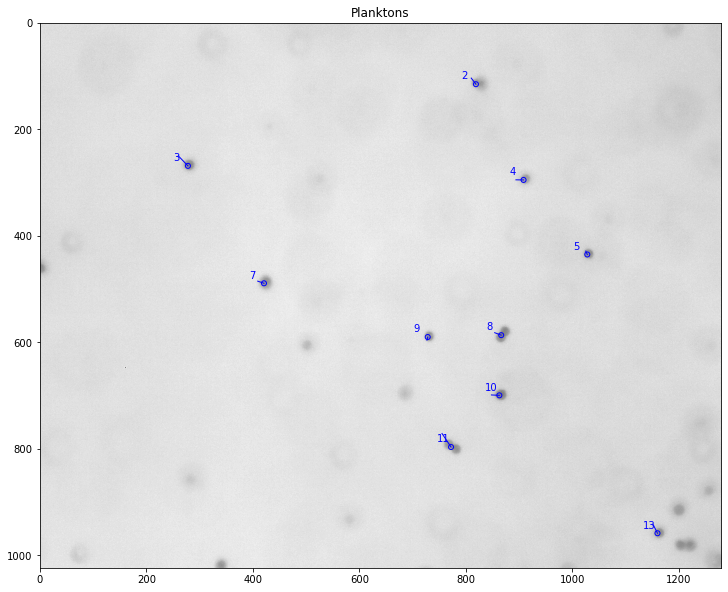

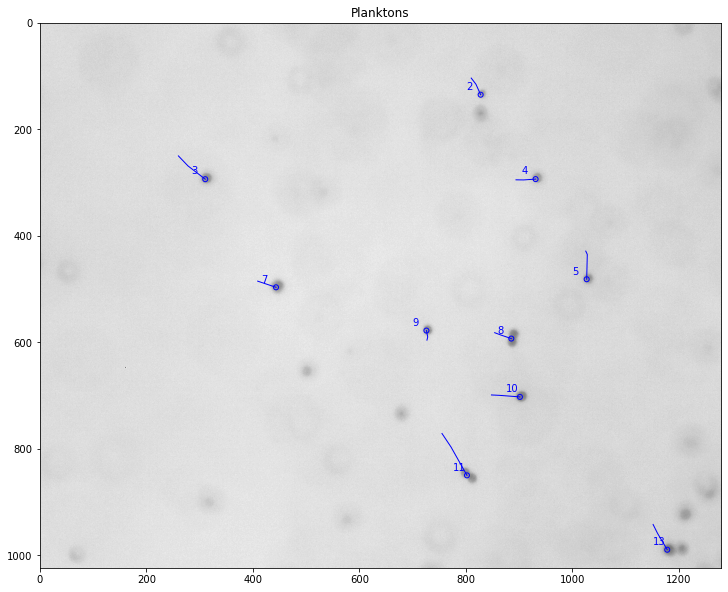

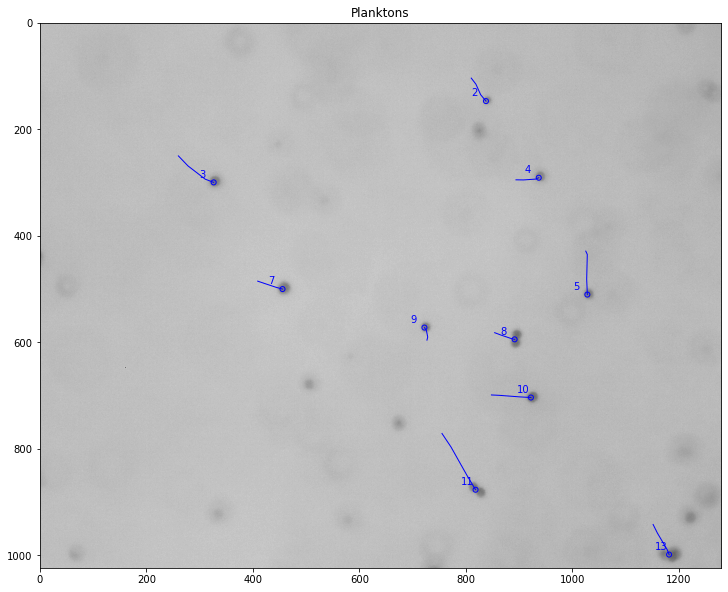

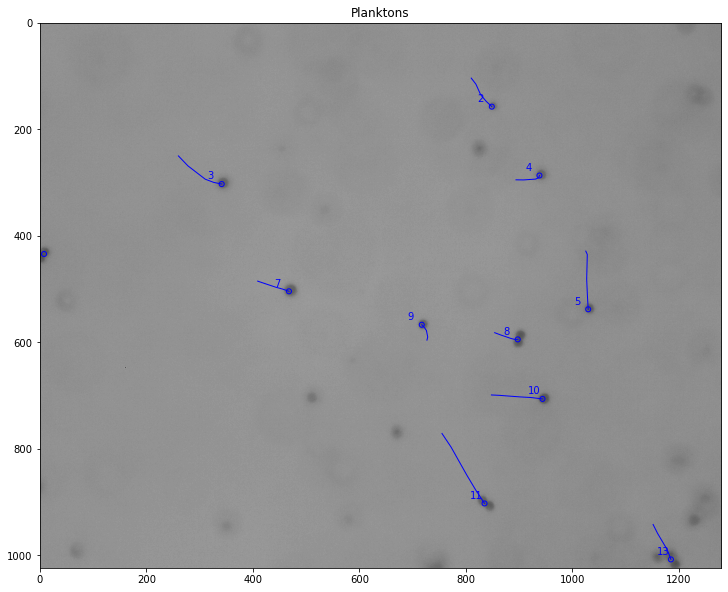

...

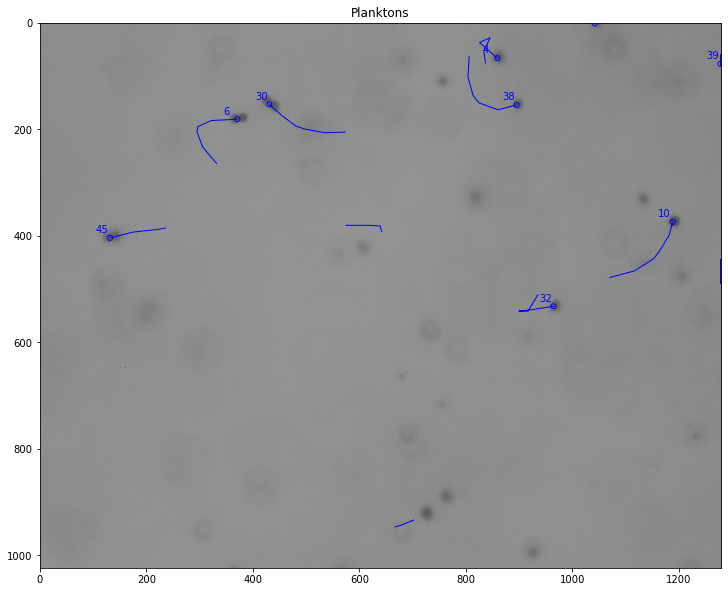

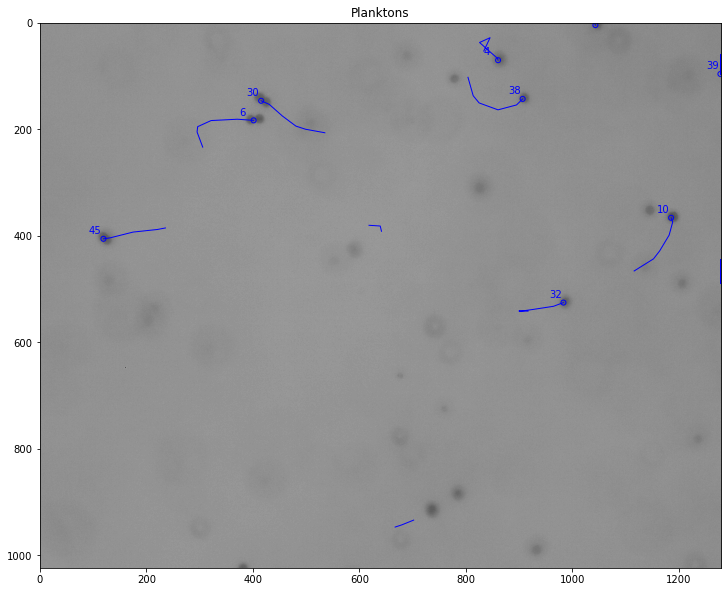

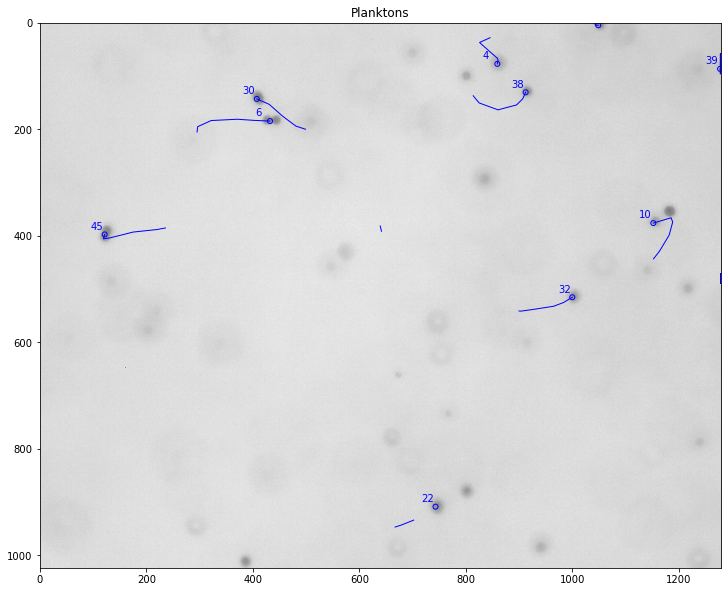

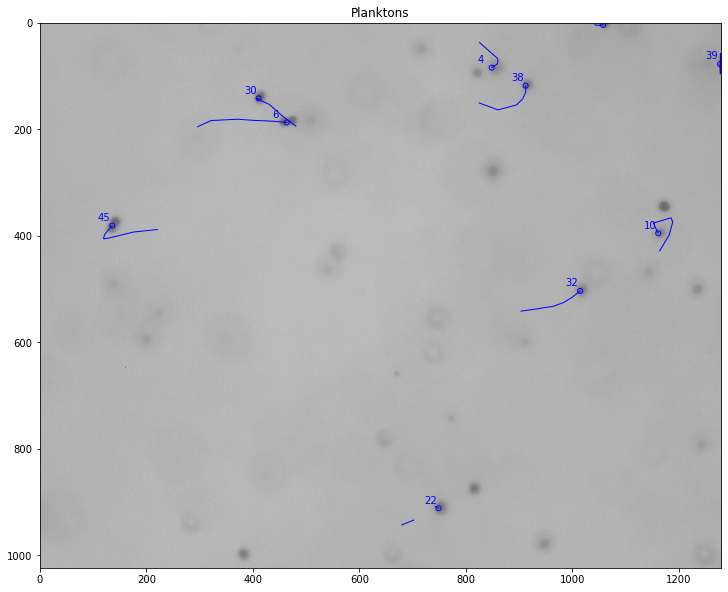

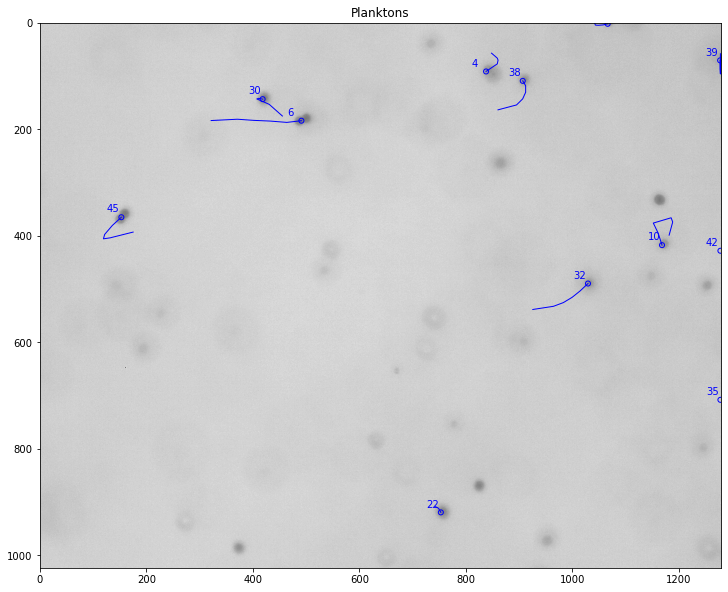

In [121]:
plot_and_save_track(no_of_frames=len(list_of_plankton[list(list_of_plankton.keys())[0]].positions),
                    plankton_track=plankton_track,
                    plankton_dont_track=plankton_dont_track,
                    folder_path='E:\Documents\Anaconda\Jupyterkod\Exjobb\Egen kod\Exjobb\From erik\\alexandrium2',
                    frame_im0=20,
                    save_images=False,
                    show_plankton_track=True,
                    show_plankton_dont_track=True,
                    show_numbers_track=True,
                    show_numbers_dont_track=True,
                    show_numbers_specific_plankton=False,
                    show_specific_plankton=False,
                    specific_plankton=None,
                    color_plankton_track='b',
                    color_plankton_dont_track='r',
                    color_specific_plankton='w',
                    save_path='E:\\Documents\\Anaconda\\Jupyterkod\\Exjobb\\Egen kod\\Exjobb\\New imulations\\Raw_output',
                    frame_name='track',
                    file_type='.jpg')


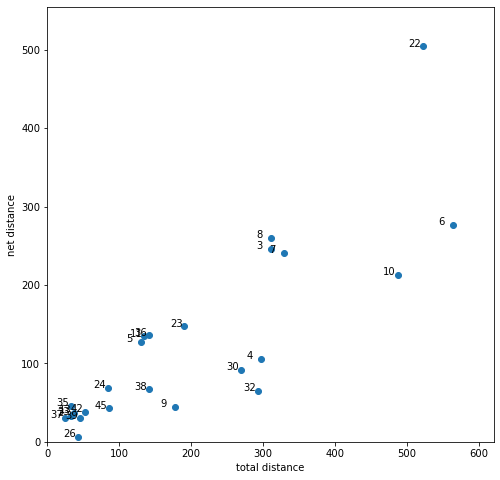

In [126]:
plot_net_vs_tot_distance(list_of_plankton)

In [127]:
list_of_plankton

{'plankton2': <utils.Plankton at 0x2a9990f41c8>,
 'plankton3': <utils.Plankton at 0x2a9990f4088>,
 'plankton4': <utils.Plankton at 0x2a979cc8e88>,
 'plankton5': <utils.Plankton at 0x2a99ab15c08>,
 'plankton6': <utils.Plankton at 0x2a99ab3f348>,
 'plankton7': <utils.Plankton at 0x2a99ab3f608>,
 'plankton8': <utils.Plankton at 0x2a99ab3f308>,
 'plankton9': <utils.Plankton at 0x2a99ab3f5c8>,
 'plankton10': <utils.Plankton at 0x2a99ab3fe08>,
 'plankton11': <utils.Plankton at 0x2a99ab3fc48>,
 'plankton13': <utils.Plankton at 0x2a99ab3f7c8>,
 'plankton22': <utils.Plankton at 0x2a9990d1188>,
 'plankton23': <utils.Plankton at 0x2a99ba646c8>,
 'plankton24': <utils.Plankton at 0x2a99ba644c8>,
 'plankton26': <utils.Plankton at 0x2a99ba1da48>,
 'plankton30': <utils.Plankton at 0x2a99ab99608>,
 'plankton32': <utils.Plankton at 0x2a99ab45608>,
 'plankton33': <utils.Plankton at 0x2a99ab915c8>,
 'plankton35': <utils.Plankton at 0x2a979d81fc8>,
 'plankton36': <utils.Plankton at 0x2a99ba7b288>,
 'plankt

In [115]:
save_positions(list_of_plankton, 
               save_path='E:\\Documents\\Anaconda\\Jupyterkod\\Exjobb\\Egen kod\\DeepTrack-2.0\\projects\\track plankton\\my_plankton_positions', 
               file_format='.csv')

In [91]:
# save_path_model = 'E:\\Documents\\Anaconda\\Jupyterkod\\Exjobb\\Egen kod\\Exjobb\\Test simulations\\Transfer rep 5 and 6\\results\\ver1\\models\\seq_len1_b10_few_plantkon.keras'
# model.save(save_path_model)


In [92]:
# load_path_model = 'E:\\Documents\\Anaconda\\Jupyterkod\\Exjobb\\Egen kod\\Exjobb\\Test simulations\\Transfer rep 5 and 6\\results\\ver1\\models\\seq_len1_b7.keras'
# model = keras.models.load_model(load_path_model, custom_objects={'softmax_categorical':softmax_categorical})